# Data Augmentation

## Important Packages Import:

In [1]:
# Install Alumentation latest version#
#!pip install -U albumentations

In [2]:
import albumentations as A
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

In [3]:
# Alumentation latest version
print(A.__version__)

1.3.0


In [4]:
#!ls
!dir

 Volume in drive C is Windows10_OS
 Volume Serial Number is 7E28-5BA2

 Directory of C:\Users\dipen\Documents\St.Marys\Super_Senior\Senior_Design\MachineLearning\Skin-Cancer-Classification-using-Deep-Learning-main\Notebooks

02/04/2025  03:06 PM    <DIR>          .
01/30/2025  12:26 PM    <DIR>          ..
01/28/2025  02:52 PM    <DIR>          .ipynb_checkpoints
02/04/2025  01:38 PM        40,992,877 Data Augumentation.ipynb
02/04/2025  11:53 AM            55,191 Data Preprocessing.ipynb
02/04/2025  03:06 PM           230,229 Exploratory Data Analysis.ipynb
               3 File(s)     41,278,297 bytes
               3 Dir(s)  567,717,539,840 bytes free


## Load the files to variable 'images'

In [5]:
images = []
for filename in os.listdir(r"C:\Users\dipen\Documents\St.Marys\Super_Senior\Senior_Design\MachineLearning\Skin-Cancer-Classification-using-Deep-Learning-main\Data\Sample_Images"):
    img = cv2.imread(os.path.join(r"C:\Users\dipen\Documents\St.Marys\Super_Senior\Senior_Design\MachineLearning\Skin-Cancer-Classification-using-Deep-Learning-main\Data\Sample_Images", filename))
    if img is not None:
        images.append(img) 

In [6]:
len(images)

203

## Sample Image details

(4000, 6000, 3)
4000
6000
3


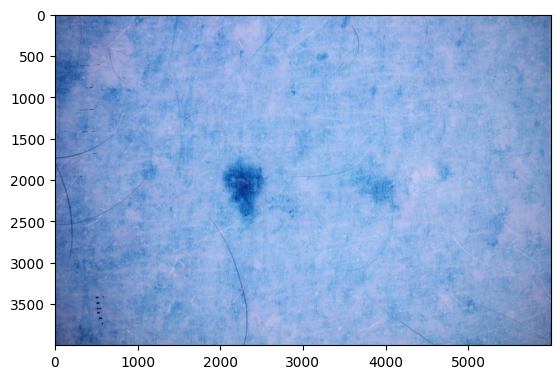

In [7]:
#Print Shape of the sample image
print(images[0].shape)

#Get the width, height and channel values from sample image
w,h,c=images[0].shape

#Print width, height and channel values of sample image
print(w)
print(h)
print(c)

#Show the sample image
plt.imshow(images[0])
plt.show()

## Get the width, height and channel values for all images

In [8]:
#Initialize the empty array for height=h, width=w and channel=c
h=[]
w=[]
c=[]

for i in range(len(images)):
  x,y,z=images[i].shape
  w.append(x)
  h.append(y)
  c.append(z)

## Show the first 10 sample images

Image: 1


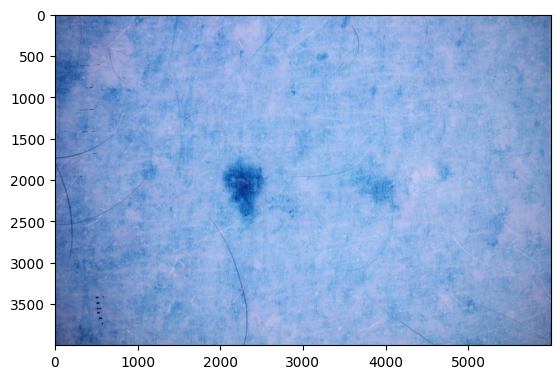

Image: 2


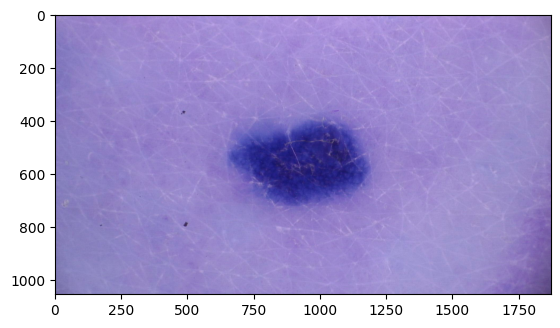

Image: 3


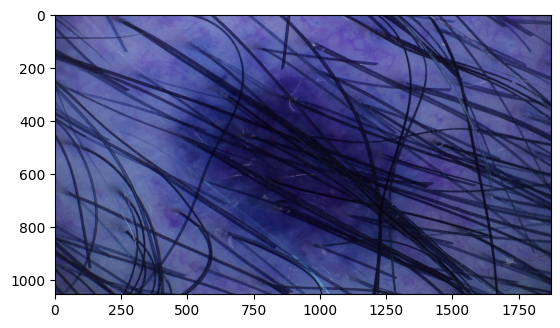

Image: 4


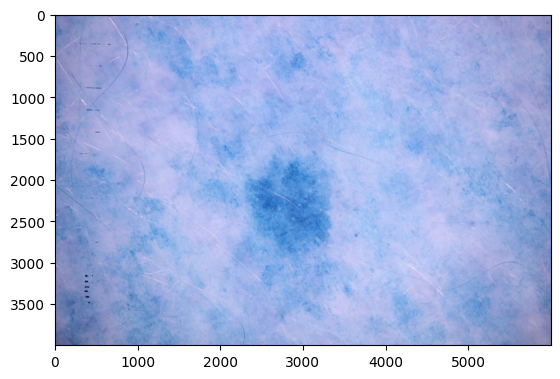

Image: 5


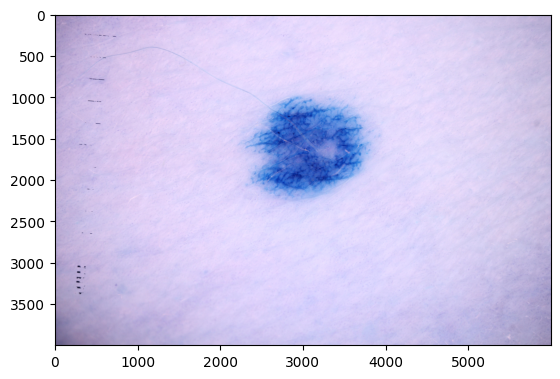

Image: 6


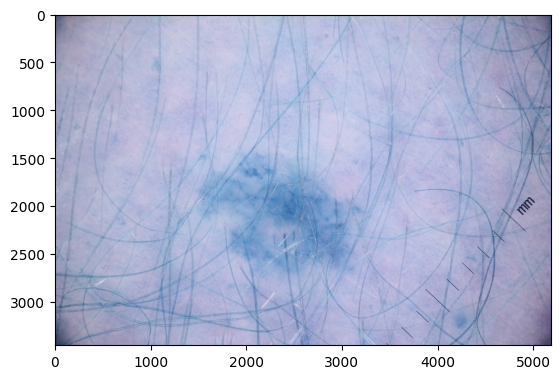

Image: 7


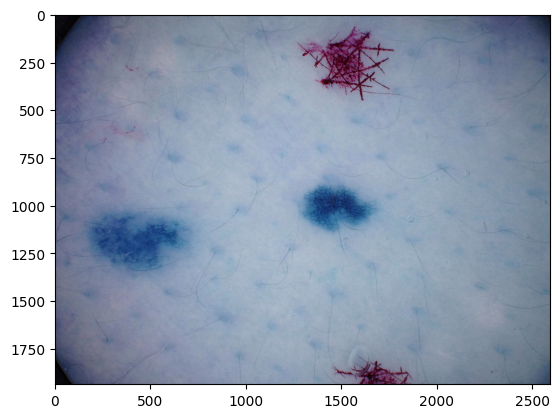

Image: 8


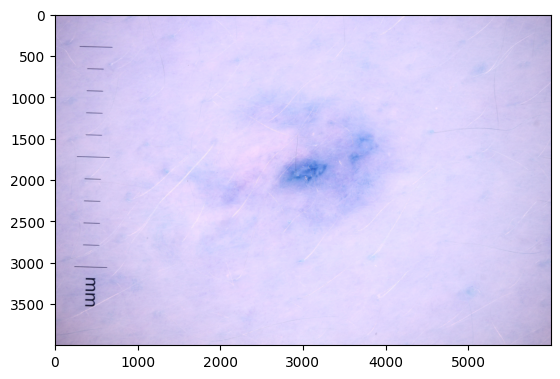

Image: 9


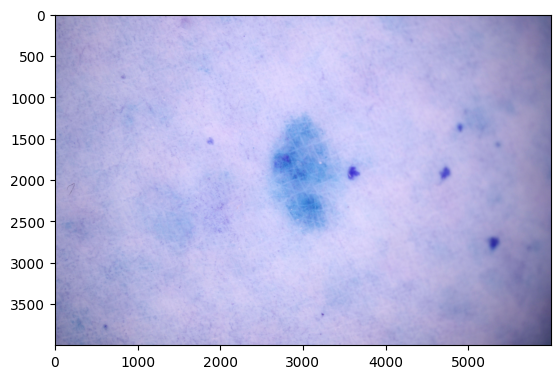

Image: 10


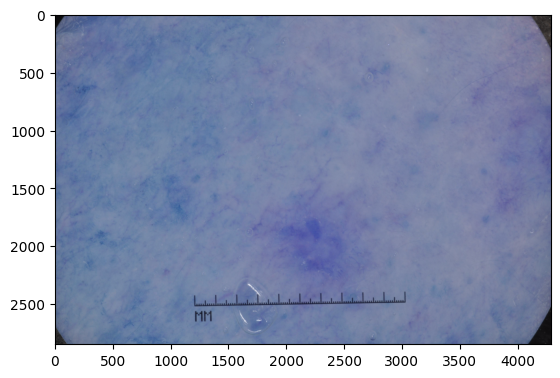

In [9]:
for i in range(10):
  print("Image:",i+1)
  plt.imshow(images[i])
  plt.show()

## Data Augmentations:

### Data Augumentation: With Blurs and Distorsions

In [10]:
transform = A.Compose([
                       A.Transpose(p=0.5),
                       A.VerticalFlip(p=0.5),
                       A.HorizontalFlip(p=0.5),
                       A.Rotate(p=0.5),
                       A.RandomBrightness(limit=0.2, p=0.5),
                       A.RandomContrast(limit=0.2, p=0.5),
                       A.OneOf([
                                A.MotionBlur(blur_limit=5, p=0.25),
                                A.MedianBlur(blur_limit=5, p=0.25),
                                A.GaussianBlur(blur_limit=5, p=0.25),
                                A.GaussNoise(var_limit=(5.0, 30.0), p=0.25)                                
                       ]),
                       A.OneOf([
                                A.OpticalDistortion(distort_limit=1.0, p=0.25),
                                A.GridDistortion(num_steps=5, distort_limit=1., p=0.25),
                                A.ElasticTransform(alpha=3, p=0.25)                               
                       ]),
                       A.CLAHE(clip_limit=4.0, p=0.7),
                       A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=20, val_shift_limit=10, p=0.5),
                       A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, border_mode=0, p=0.85),
                       A.Resize(width=722, height=542, p=0.5),
                       A.Normalize(max_pixel_value=255.0,p=0.5),
                       A.Cutout(max_h_size=int(h[i]*0.1), max_w_size=int(w[i]*0.1), num_holes=8, p=0.7)
                       ])

C:\Users\dipen\anaconda3\envs\skin-cancer-V1-env\lib\site-packages\albumentations\augmentations\transforms.py:1149: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
C:\Users\dipen\anaconda3\envs\skin-cancer-V1-env\lib\site-packages\albumentations\augmentations\transforms.py:1175: FutureWarning: RandomContrast has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
C:\Users\dipen\anaconda3\envs\skin-cancer-V1-env\lib\site-packages\albumentations\augmentations\blur\transforms.py:184: UserWarning: blur_limit and sigma_limit minimum value can not be both equal to 0. blur_limit minimum value changed to 3.
  warnings.warn(
C:\Users\dipen\anaconda3\envs\skin-cancer-V1-env\lib\site-packages\albumentations\augmentations\dropout\cutout.py:49: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  warnings.warn(


### Data Augumentation: Without Blurs and Distorsions

In [11]:
transform1 = A.Compose([
                        A.Transpose(p=0.5),
                        A.Flip(p=0.5),
                        A.OneOf([
                                 A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3),
                                 A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1)
                                 ],p=1),
                        A.GaussianBlur(p=0.05),
                        A.HueSaturationValue(p=0.5),
                        A.RGBShift(p=0.5),
                        ])

### Augmentation of first 50 images images with the 2 augmentations

Sample Image 1:


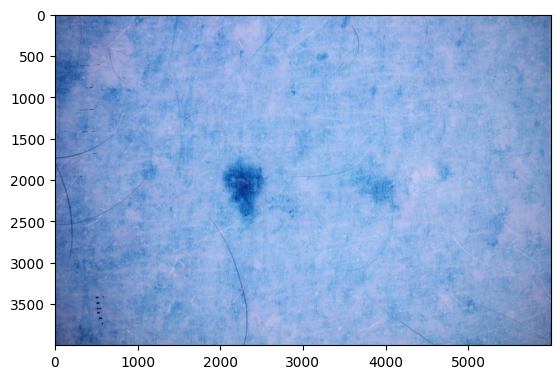

Augmentated Image with Blur and distorsion 1:


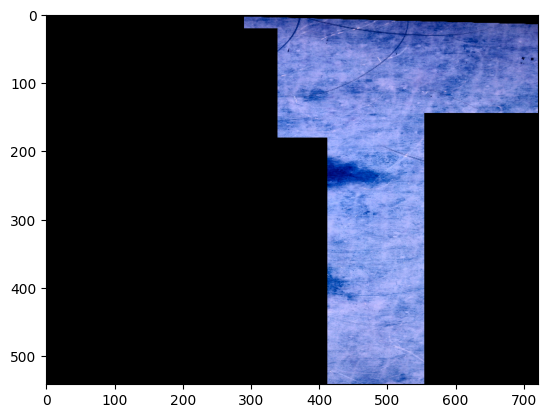

Augmentated Image without Blur and distorsion 1:


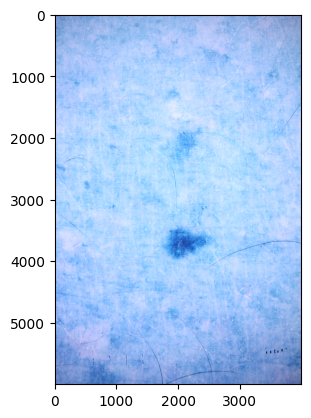

Sample Image 2:


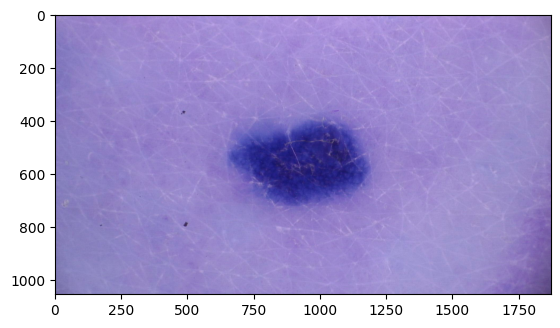

Augmentated Image with Blur and distorsion 2:


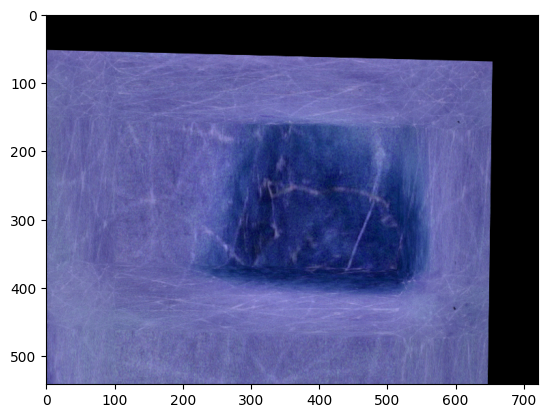

Augmentated Image without Blur and distorsion 2:


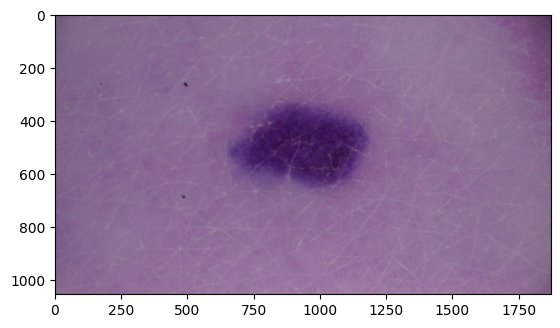

Sample Image 3:


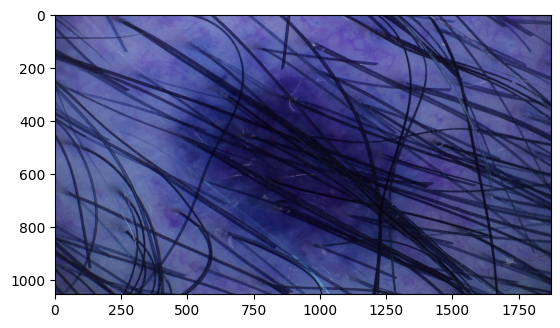

Augmentated Image with Blur and distorsion 3:


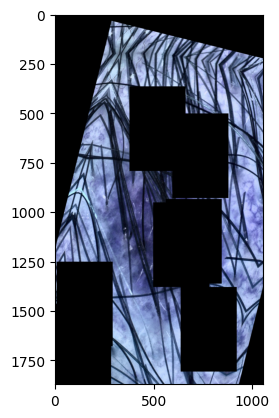

Augmentated Image without Blur and distorsion 3:


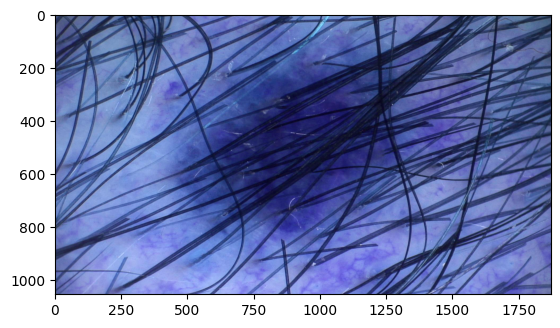

Sample Image 4:


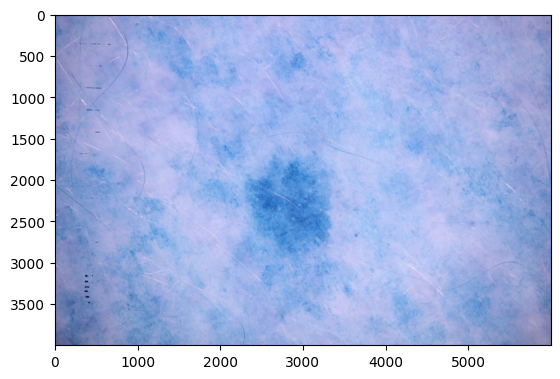

Augmentated Image with Blur and distorsion 4:


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


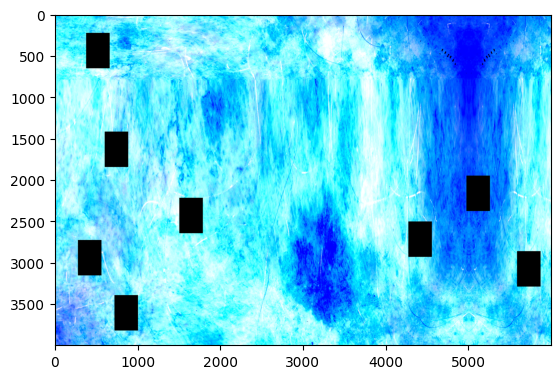

Augmentated Image without Blur and distorsion 4:


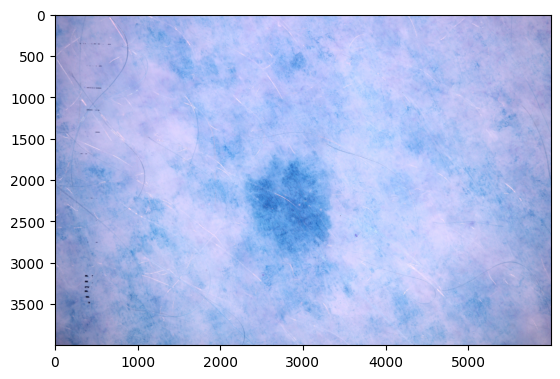

Sample Image 5:


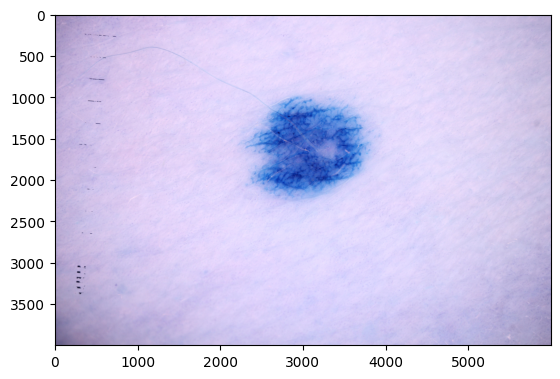

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 5:


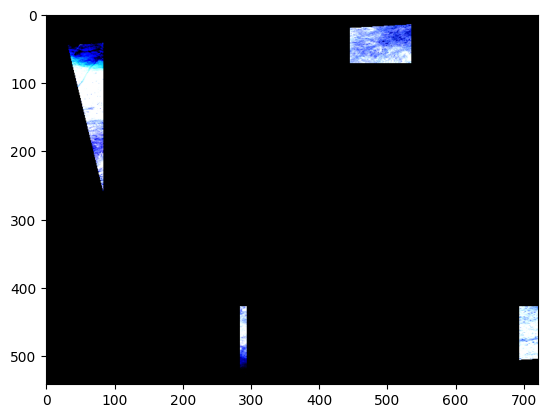

Augmentated Image without Blur and distorsion 5:


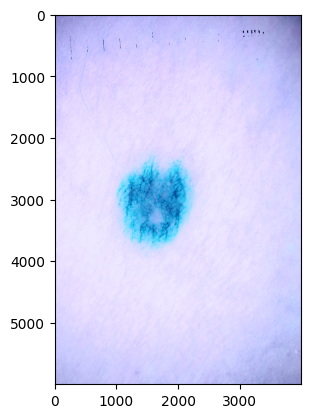

Sample Image 6:


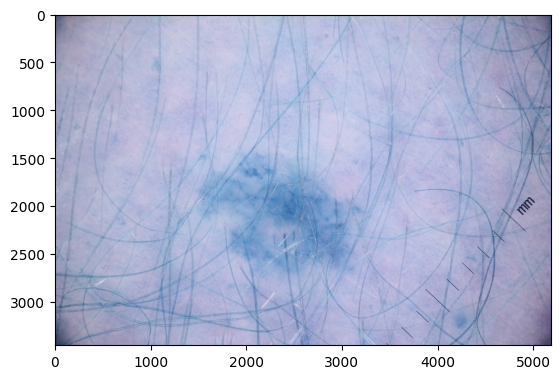

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 6:


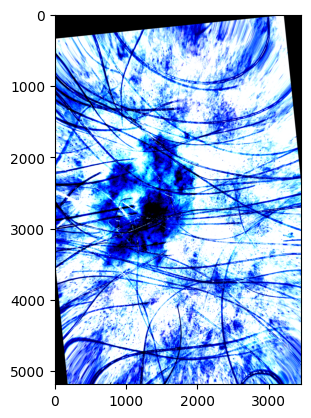

Augmentated Image without Blur and distorsion 6:


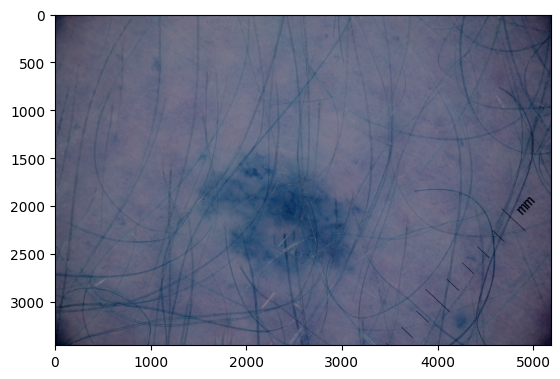

Sample Image 7:


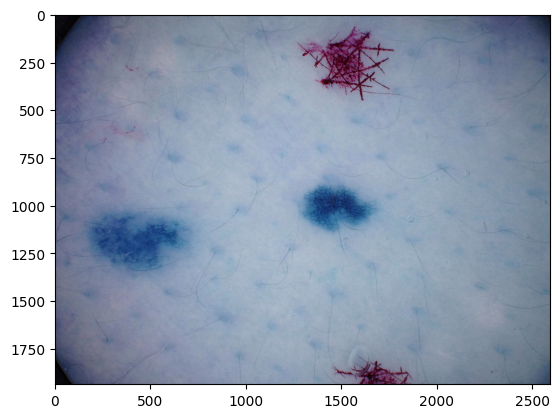

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 7:


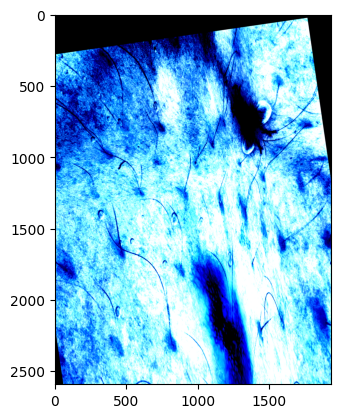

Augmentated Image without Blur and distorsion 7:


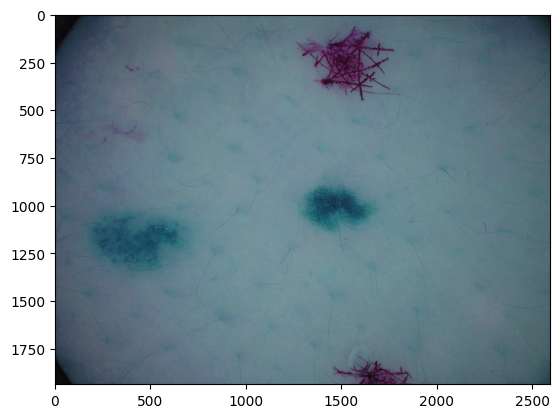

Sample Image 8:


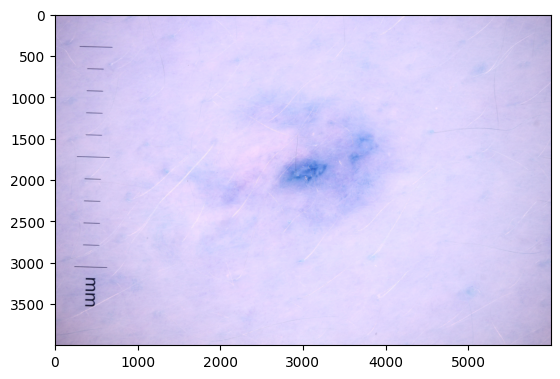

Augmentated Image with Blur and distorsion 8:


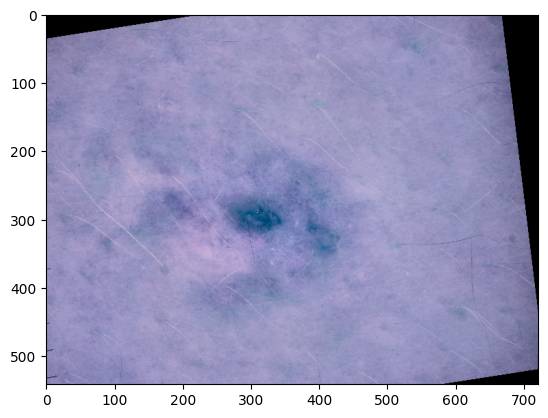

Augmentated Image without Blur and distorsion 8:


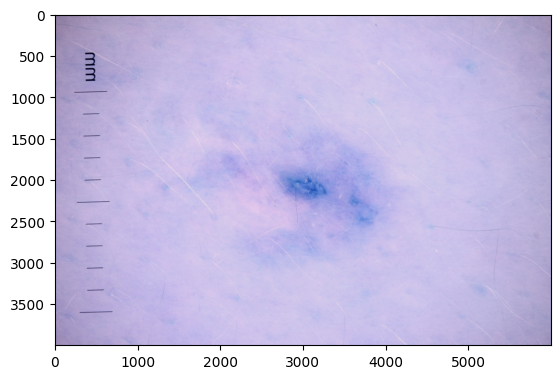

Sample Image 9:


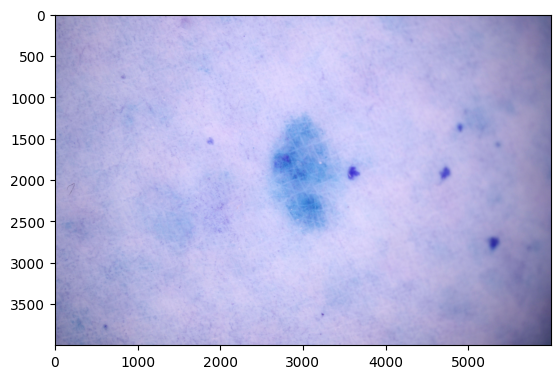

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 9:


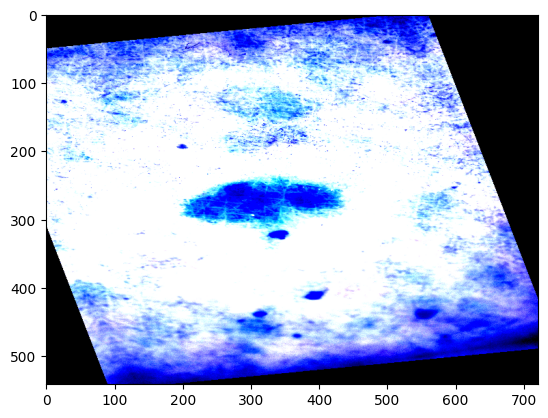

Augmentated Image without Blur and distorsion 9:


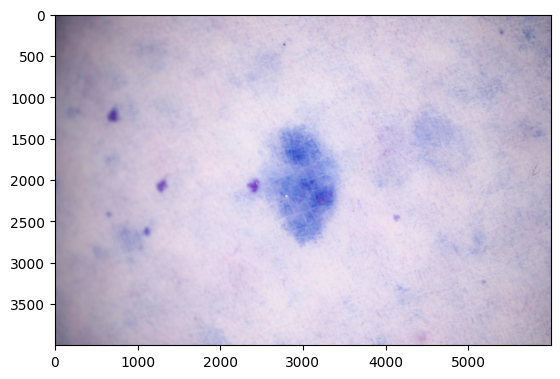

Sample Image 10:


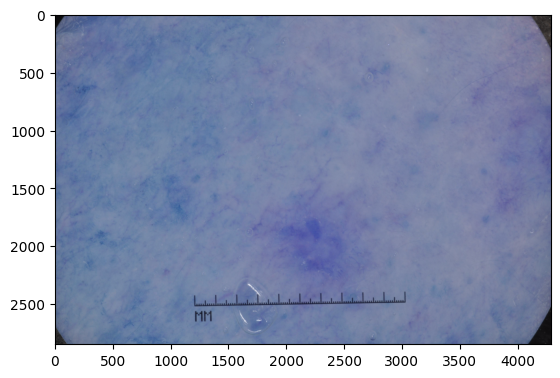

Augmentated Image with Blur and distorsion 10:


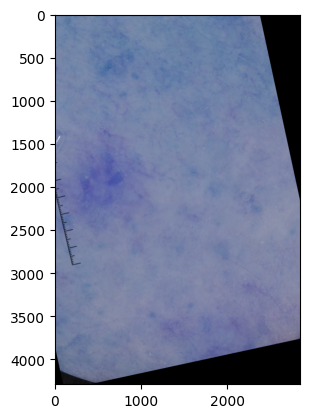

Augmentated Image without Blur and distorsion 10:


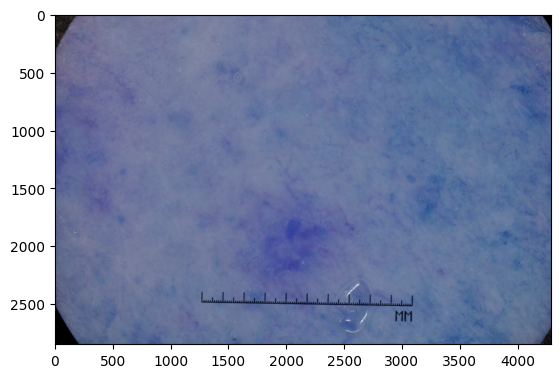

Sample Image 11:


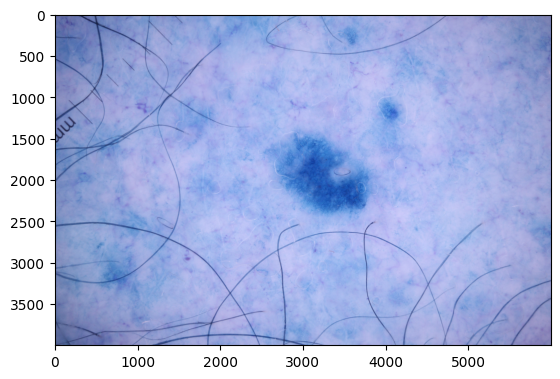

Augmentated Image with Blur and distorsion 11:


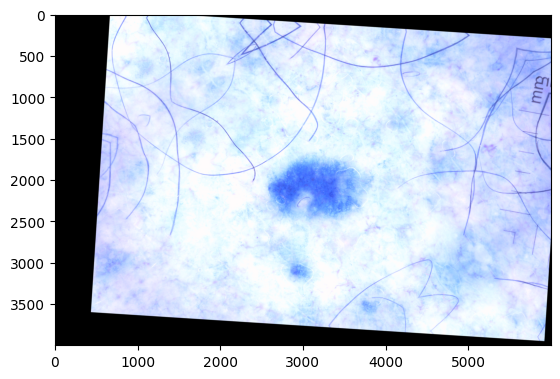

Augmentated Image without Blur and distorsion 11:


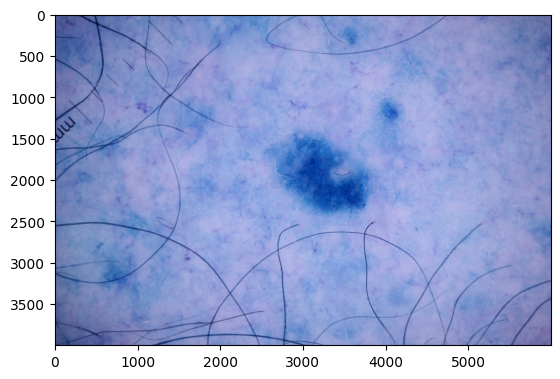

Sample Image 12:


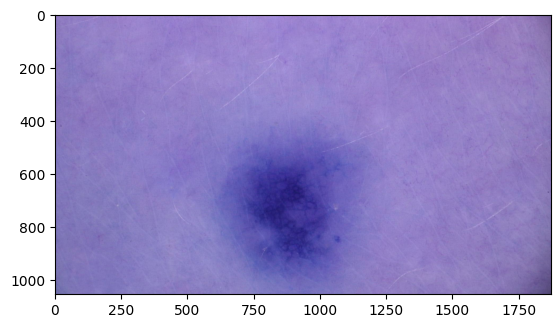

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 12:


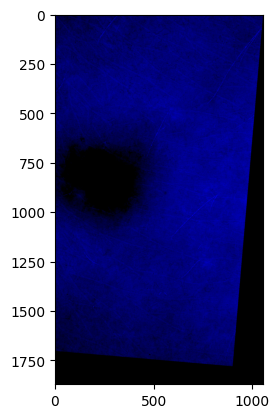

Augmentated Image without Blur and distorsion 12:


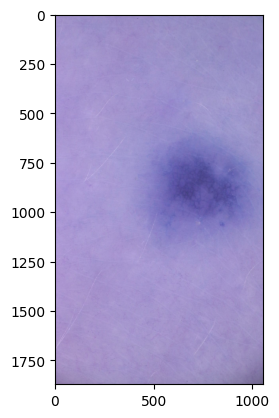

Sample Image 13:


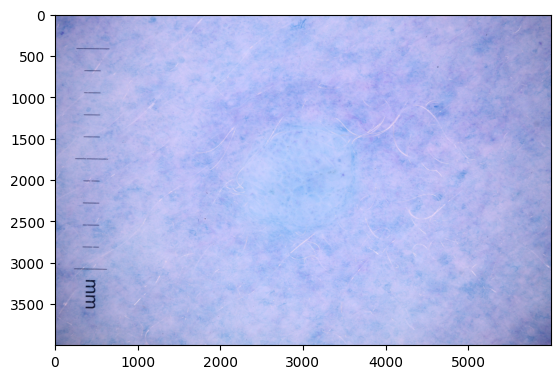

Augmentated Image with Blur and distorsion 13:


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


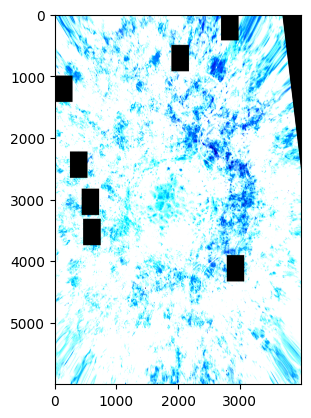

Augmentated Image without Blur and distorsion 13:


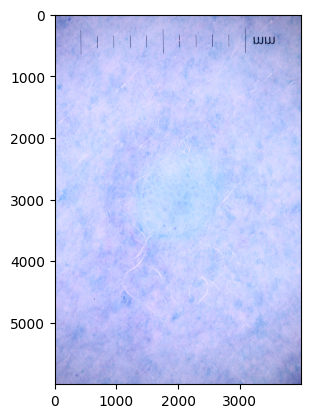

Sample Image 14:


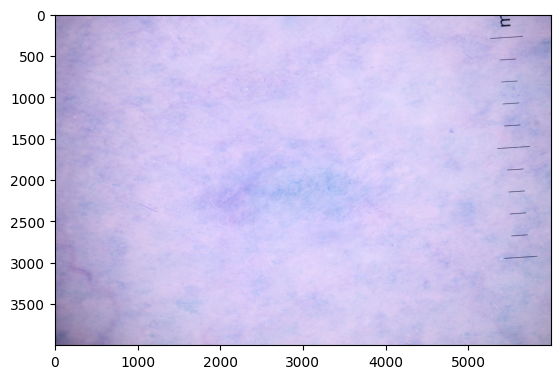

Augmentated Image with Blur and distorsion 14:


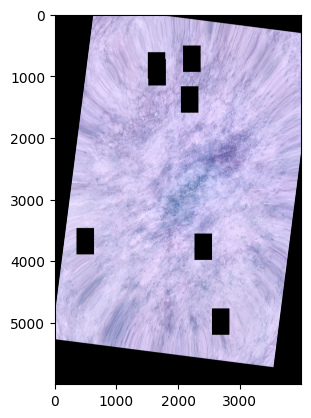

Augmentated Image without Blur and distorsion 14:


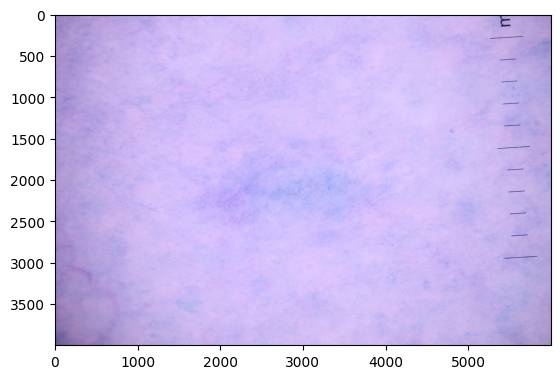

Sample Image 15:


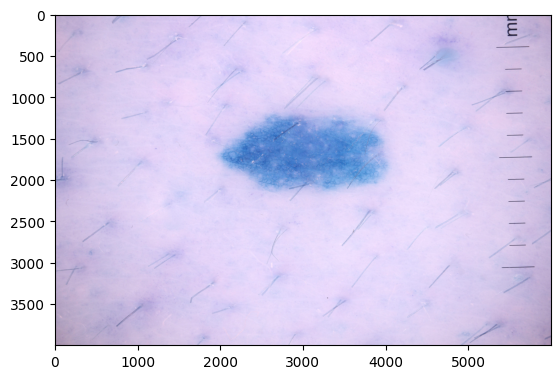

Augmentated Image with Blur and distorsion 15:


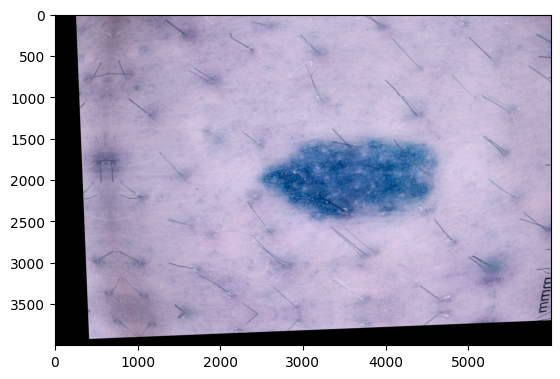

Augmentated Image without Blur and distorsion 15:


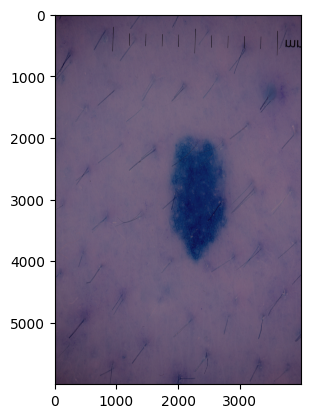

Sample Image 16:


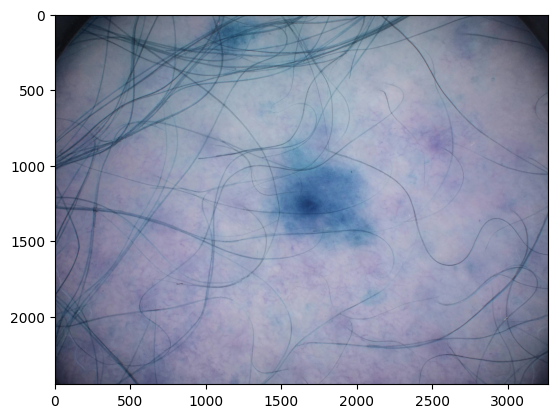

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 16:


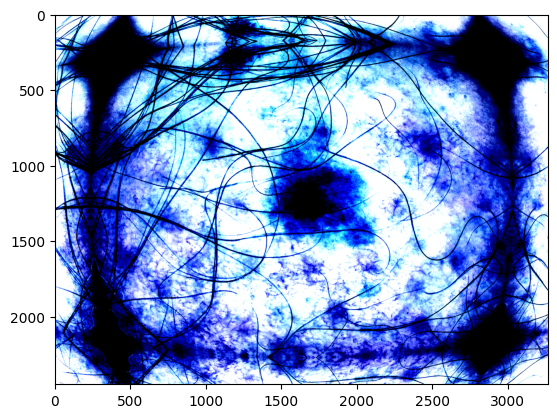

Augmentated Image without Blur and distorsion 16:


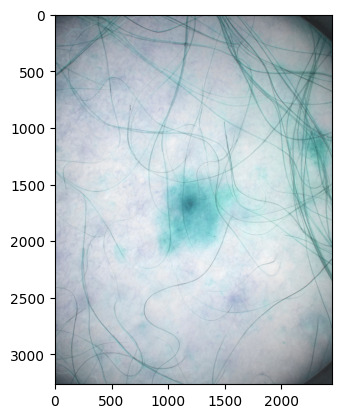

Sample Image 17:


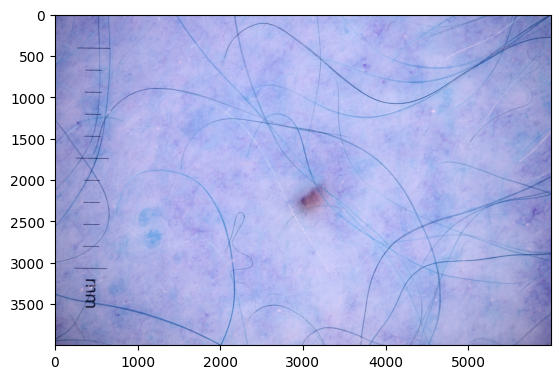

In [ ]:
for i in range(50):
  #with Blur and distorsion
  transformed = transform(image=images[i])
  transformed_image = transformed["image"]
  
  #without Blur and distorsion
  transformed1 = transform1(image=images[i])
  transformed_image1 = transformed1["image"]
  
  print('Sample Image {}:'.format(i+1))
  plt.imshow(images[i])
  plt.show()
  
  print('Augmentated Image with Blur and distorsion {}:'.format(i+1))
  plt.imshow(transformed_image)
  plt.show()

  print('Augmentated Image without Blur and distorsion {}:'.format(i+1))
  plt.imshow(transformed_image1)
  plt.show()